The Problem

How accurate can different models determine the position of different players


Methods
I used a random forrest and Kmeans to determine the accuracy of each position
I will then create a decision tree to see what features were most important in determine which category to place a player

Results
By using a random forest we get about 63 percent accuracy and for a kmeans it was less at about 50 percent accuracy

In [0]:
from google.colab import files
import io
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import *
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *
from sklearn.svm import SVC
from sklearn.tree import *
import numpy as np
from sklearn.preprocessing import *
from keras.models import Sequential
from keras.layers import *
#import pydot
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


In [0]:
!pip install pandas_ml

In [0]:
from pandas_ml import ConfusionMatrix

In [0]:
!pip install mlxtend

In [0]:
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install -q pydot
import pydot

In [0]:
uploaded1 = files.upload()

Saving Seasons_Stats.csv to Seasons_Stats (1).csv


In [0]:
uploaded2 = files.upload()

Saving Players.csv to Players (1).csv


In [0]:
data = pd.read_csv(io.StringIO(uploaded1['Seasons_Stats.csv'].decode('utf-8')))
data1 = pd.read_csv(io.StringIO(uploaded2['Players.csv'].decode('utf-8')))
#data = data.drop(columns=['Unnamed: 0','blank2'])
#data = data.dropna(subset=['PER', 'ORB', 'GS'])
#data = data.fillna(value=0)

In [0]:
stats = data.drop(['B', 'blank2', 'Tm', 'blanl'], axis=1)
players = data1.drop(['Unnamed: 0'], axis=1)

In [0]:
data = pd.merge(stats, players[['Player', 'height', 'weight']], left_on='Player', right_on='Player', right_index=False, how='left', sort=False).fillna(value=0)
data = data[~(data['Pos']==0) & (data['MP'] > 400)]
data.reset_index(inplace=True, drop=True)
data['Player'] = data['Player'].str.replace('*', '')
per36 = ['PER', 'OWS', 'DWS', 'WS', 'OBPM', 'DBPM', 'VORP', 'FG', 'FGA', '3P', '3PA', '2P', '2PA', 'FT', 'FTA', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']
for col in per36:
    data[col] = 36 * data[col] / data['MP']
data.tail()

,Year,Player,Pos,Age,G,GS,MP,PER,TS%,3PAr,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,height,weight
17486,2017.0,Cody Zeller,PF,24.0,62.0,58.0,1725.0,0.348522,0.604,0.002,...,5.634783,8.452174,2.066087,1.293913,1.210435,1.356522,3.944348,13.335652,213.0,108.0
17487,2017.0,Tyler Zeller,C,27.0,51.0,5.0,525.0,0.891429,0.508,0.006,...,5.554286,8.502857,2.880000,0.480000,1.440000,1.371429,4.182857,12.205714,213.0,114.0
17488,2017.0,Paul Zipser,SF,22.0,44.0,18.0,843.0,0.294662,0.503,0.448,...,4.697509,5.338078,1.537367,0.640569,0.683274,1.708185,3.330961,10.249110,203.0,97.0
17489,2017.0,Ivica Zubac,C,19.0,38.0,11.0,609.0,1.004926,0.547,0.013,...,6.975369,9.399015,1.773399,0.827586,1.950739,1.773399,3.901478,16.788177,216.0,120.0
17490,2018.0,Ben Simmons,PG,21.0,81.0,81.0,2732.0,0.263543,0.557,0.011,...,6.773060,8.683748,8.710102,1.844802,0.922401,3.663250,2.780381,16.853587,0.0,0.0


In [0]:
data.at[17490, 'height'] = 208
data.at[17490, 'weight'] = 104
data.tail()

,Year,Player,Pos,Age,G,GS,MP,PER,TS%,3PAr,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,height,weight
17486,2017.0,Cody Zeller,PF,24.0,62.0,58.0,1725.0,0.348522,0.604,0.002,...,5.634783,8.452174,2.066087,1.293913,1.210435,1.356522,3.944348,13.335652,213.0,108.0
17487,2017.0,Tyler Zeller,C,27.0,51.0,5.0,525.0,0.891429,0.508,0.006,...,5.554286,8.502857,2.880000,0.480000,1.440000,1.371429,4.182857,12.205714,213.0,114.0
17488,2017.0,Paul Zipser,SF,22.0,44.0,18.0,843.0,0.294662,0.503,0.448,...,4.697509,5.338078,1.537367,0.640569,0.683274,1.708185,3.330961,10.249110,203.0,97.0
17489,2017.0,Ivica Zubac,C,19.0,38.0,11.0,609.0,1.004926,0.547,0.013,...,6.975369,9.399015,1.773399,0.827586,1.950739,1.773399,3.901478,16.788177,216.0,120.0
17490,2018.0,Ben Simmons,PG,21.0,81.0,81.0,2732.0,0.263543,0.557,0.011,...,6.773060,8.683748,8.710102,1.844802,0.922401,3.663250,2.780381,16.853587,208.0,104.0


In [0]:
lbj = data[~data.Player.str.contains("LeBron James")]
kb = data[~data.Player.str.contains("Kobe Bryant")]
mj = data[~data.Player.str.contains("Kevin Durant")]

In [0]:
X = mj.drop(['Player', 'Pos', 'G', 'GS', 'MP'], axis=1).as_matrix()
y = mj['Pos'].as_matrix()
X1 = mj.drop(['Player', 'Pos', 'G', 'GS', 'MP'], axis=1)
y1 = mj['Pos']


In [0]:
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.33, random_state=42)

In [0]:
encode = LabelBinarizer()
y_pos = encode.fit_transform(y)
numlabels = len(encode.classes_)
scale = StandardScaler()
Xnorm = scale.fit_transform(X)
stats00 = (mj['Year'] >= 2000)
X_train = Xnorm[~stats00]
y_train = y_pos[~stats00]
X_test = Xnorm[stats00]
y_test = y_pos[stats00]
#X_train, X_test, y_train, y_test = train_test_split(Xnorm, y_pos, test_size=0.33, random_state=42)

In [0]:
model = Sequential()
model.add(Dense(40, activation='relu', input_dim=46))
model.add(Dropout(0.5))
model.add(Dense(40, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(numlabels, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=200, batch_size=128)

Epoch 1/200
10320/10320 [==============================] - 1s 77us/step - loss: 3.0284 - acc: 0.1217
Epoch 2/200
10320/10320 [==============================] - 0s 16us/step - loss: 2.3081 - acc: 0.2506
Epoch 3/200
10320/10320 [==============================] - 0s 16us/step - loss: 1.9296 - acc: 0.3160
Epoch 4/200
10320/10320 [==============================] - 0s 17us/step - loss: 1.7144 - acc: 0.3477
Epoch 5/200
10320/10320 [==============================] - 0s 16us/step - loss: 1.5585 - acc: 0.3803
Epoch 6/200
10320/10320 [==============================] - 0s 16us/step - loss: 1.4402 - acc: 0.4123
Epoch 7/200
10320/10320 [==============================] - 0s 16us/step - loss: 1.3589 - acc: 0.4269
Epoch 8/200
10320/10320 [==============================] - 0s 15us/step - loss: 1.3036 - acc: 0.4493
Epoch 9/200
10320/10320 [==============================] - 0s 15us/step - loss: 1.2434 - acc: 0.4742
Epoch 10/200
10320/10320 [==============================] - 0s 15us/step - loss: 1.2129 - a

In [0]:
model.test_on_batch(X_test, y_test)

[0.92456996, 0.69738865]

In [0]:
first_team_members = ['Russell Westbrook', 'James Harden', 'Anthony Davis', 'LeBron James', 'Kawhi Leonard']
first_team_stats = data[[((x[1]['Player'] in first_team_members) & (x[1]['Year']==2017)) for x in data.iterrows()]]
first_team_stats
ben = ['Ben Simmons']
ben_stat = data[[((x[1]['Player'] in ben) & (x[1]['Year']==2018)) for x in data.iterrows()]]
first_team_stats
charles = ['Charles Barkley']
charles_stats = data[(data['Player'] == 'Kevin Durant')]
charles_stats

,Year,Player,Pos,Age,G,GS,MP,PER,TS%,3PAr,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,height,weight
13477,2008.0,Kevin Durant,SG,19.0,80.0,80.0,2768.0,0.205491,0.519,0.150,...,3.615607,4.526012,2.497110,1.014451,0.975434,3.017341,1.586705,21.121387,206.0,108.0
13880,2009.0,Kevin Durant,SF,20.0,74.0,74.0,2885.0,0.259549,0.577,0.165,...,5.053726,6.014558,2.558059,1.197920,0.661352,2.807626,1.672097,23.346967,206.0,108.0
14271,2010.0,Kevin Durant,SF,21.0,82.0,82.0,3239.0,0.291201,0.607,0.210,...,5.757333,6.924359,2.567459,1.244829,0.933621,3.012041,1.900587,27.475147,206.0,108.0
14693,2011.0,Kevin Durant,SF,22.0,78.0,78.0,3038.0,0.279658,0.589,0.269,...,5.640553,6.315997,2.535879,1.042791,0.900592,2.583278,1.884134,25.607637,206.0,108.0
15105,2012.0,Kevin Durant,SF,23.0,66.0,66.0,2546.0,0.370463,0.610,0.265,...,6.886096,7.451689,3.266300,1.244305,1.088767,3.506677,1.880597,26.158680,206.0,108.0
15497,2013.0,Kevin Durant,SF,24.0,81.0,81.0,3119.0,0.326643,0.647,0.233,...,6.856044,7.386983,4.316768,1.338891,1.211927,3.231805,1.650529,26.316127,206.0,108.0
15906,2014.0,Kevin Durant,SF,25.0,81.0,81.0,3122.0,0.343626,0.635,0.291,...,6.226778,6.895580,5.131326,1.187700,0.680333,3.286355,2.006406,29.900064,206.0,108.0
16314,2015.0,Kevin Durant,SF,26.0,27.0,27.0,913.0,1.088280,0.633,0.340,...,6.387733,7.018620,4.337349,0.946331,0.985761,2.917853,1.577218,27.049288,206.0,108.0
16753,2016.0,Kevin Durant,SF,27.0,72.0,72.0,2578.0,0.393794,0.634,0.348,...,7.596587,8.224981,5.041117,0.963538,1.186967,3.491078,1.913111,28.333592,206.0,108.0
17176,2017.0,Kevin Durant,SF,28.0,62.0,62.0,2070.0,0.480000,0.651,0.304,...,8.243478,8.921739,5.217391,1.147826,1.721739,2.400000,2.034783,27.043478,206.0,108.0


In [0]:
pd.DataFrame(index=charles_stats.loc[:, 'Player'].values, data={'Real': charles_stats.loc[:, 'Pos'].values,
    'Predicted':encode.inverse_transform(model.predict(Xnorm[charles_stats.index, :]))})

,Predicted,Real
Kevin Durant,SG,SG
Kevin Durant,C,SF
Kevin Durant,SF,SF
Kevin Durant,C,SF
Kevin Durant,PF,SF
Kevin Durant,C,SF
Kevin Durant,PG,SF
Kevin Durant,PG,SF
Kevin Durant,SG,SF
Kevin Durant,PF,SF


In [0]:
rf = RandomForestClassifier(n_estimators=1000)
rf.fit(X_train,y_train)
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=9, p=2,
           weights='uniform')

In [0]:
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)
cm = ConfusionMatrix(y_test, y_pred)

0.7774120907673653


/usr/local/lib/python3.6/dist-packages/pandas_ml/confusion_matrix/abstract.py:66: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  df = df.loc[idx, idx.copy()].fillna(0)  # if some columns or rows are missing


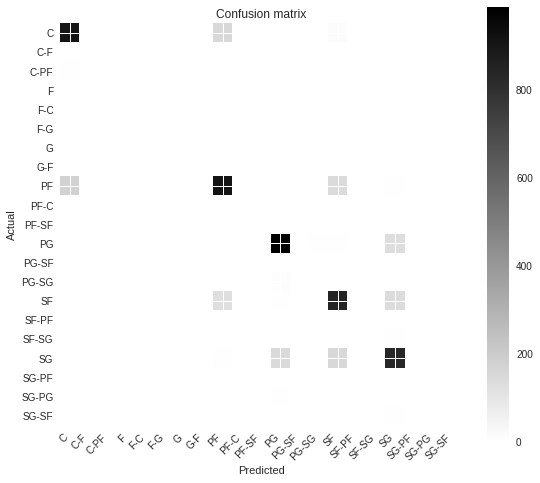

In [0]:
cm.plot()

0.7588775333448814


/usr/local/lib/python3.6/dist-packages/pandas_ml/confusion_matrix/abstract.py:66: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  df = df.loc[idx, idx.copy()].fillna(0)  # if some columns or rows are missing


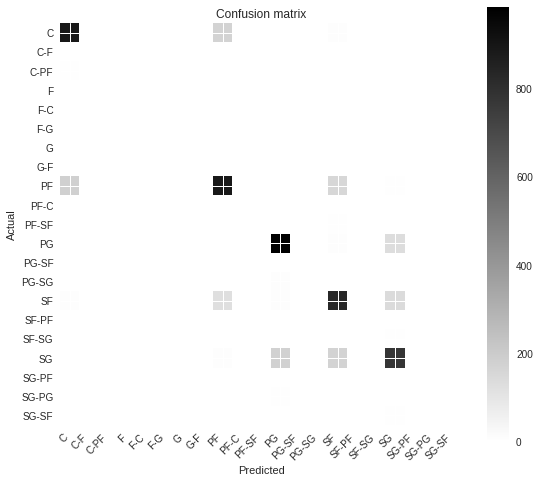

In [0]:
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)
cm = ConfusionMatrix(y_test, y_pred)
#print(cm)
#plt.matshow(cm)
#plt.title('Confusion matrix')
#plt.colorbar()
#plt.ylabel('True label')
#plt.xlabel('Predicted label')
#plt.show()
cm.plot()

array(['SG', 'SG', 'SG', ..., 'SF', 'PF', 'PG'], dtype=object)

In [0]:
tree = DecisionTreeClassifier()

tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [0]:
!pip install pydotplus

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.132357 to fit



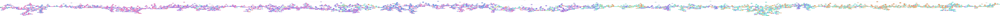

In [0]:
import pydotplus
from sklearn.externals.six import StringIO  
from IPython.display import Image  

path=StringIO()
export_graphviz(tree, out_file=path,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(path.getvalue())
Image(graph.create_png())

In [0]:
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.232765 to fit



In [0]:
feature = data.drop(['MP', 'Player','Pos', 'G', 'GS'], axis=1)

In [0]:
features = pd.DataFrame(rf.feature_importances_, index = feature.columns, columns=['importance']).sort_values('importance', ascending=False)
features

,importance
height,0.109040
TRB,0.070692
AST,0.068325
weight,0.053001
TRB%,0.051554
AST%,0.051120
DRB%,0.032288
DRB,0.032276
BLK,0.025445
ORB%,0.023537


In [0]:
classes = data.Pos.unique()

In [0]:
import pydotplus
from sklearn.externals.six import StringIO  
from IPython.display import Image
path=StringIO()
export_graphviz(estimator, out_file=path, feature_names=feature.columns, class_names=classes, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(path.getvalue())

In [0]:
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.22314 to fit

